# Load packages

In [1]:
import os
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd 
import skimage.io

from collections import defaultdict
from tqdm.auto import tqdm
from joblib import Parallel, delayed
import re
import tifffile as tiff
import pickle

import networkx as nx
from sklearn.model_selection import train_test_split

import torch_geometric.utils
import torch
import h5py

c:\Users\thu71\AppData\Local\anaconda3\envs\torch\Lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
c:\Users\thu71\AppData\Local\anaconda3\envs\torch\Lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
c:\Users\thu71\AppData\Local\anaconda3\envs\torch\Lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
p_dir = (Path().cwd().parents[0]).absolute()

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
data_dir = (Path().cwd().parents[0] / 'data').absolute()

In [5]:
import graph
import torch
import torch_geometric.utils
import networkx as nx
import lightning.pytorch as pl
import torch.utils.data as data

spatial_omics_folder = (Path().cwd().parents[0]).absolute() / 'data' / 'spatial_omics_graph'
process_path = (Path().cwd().parents[0]).absolute() / 'data' / 'torch_graph_data'

c:\Users\thu71\AppData\Local\anaconda3\envs\torch\Lib\site-packages\torchaudio\backend\utils.py:74: UserWarning: No audio backend is available.
  warnings.warn("No audio backend is available.")


In [6]:
# Import spatial omics library
import athena as ath
from spatialOmics import SpatialOmics

# import default graph builder parameters
from athena.graph_builder.constants import GRAPH_BUILDER_DEFAULT_PARAMS
import networkx as nx

In [7]:
def visualize_graph(G, pos, color, figsize=(15,15), **kwargs):
    fig, ax = plt.subplots(figsize=figsize)
    plt.xticks([])
    plt.yticks([])
    nx.draw_networkx(G, pos=pos, with_labels=False, 
                     node_color=color, ax=ax, **kwargs)
    ax.axis('equal')
    ax.invert_yaxis()
    ax.set_facecolor('k')
    plt.show()

## Read data Frame

In [8]:
import scanpy as sc
import anndata as ad 
# # Import spatial omics library
import athena as ath
from spatialOmics import SpatialOmics

import networkx as nx
import matplotlib 

# Save data
save_path = (Path().cwd().parents[0]).absolute() / 'data' / 'adata'

# adata_combined = ad.read_h5ad(save_path / 'all.h5ad')
adata_foll = ad.read_h5ad(save_path / 'foll.h5ad')
name_map =  { '1':'B-cell', '7':'FDC',  '0': 'Ki67+ B-cell', '4': 'Ki67+', '18': 'FDC', '8':'Other',  '11':'Macrophage',  '6':'Macrophage', '6':'Macrophage', '3':'Plasma Cell', '13':'Other','5': 'Ki67+ Macrophage',}

adata_foll.obs['name'] = (
    adata_foll.obs["merged"]
    .map(lambda x: name_map.get(x, x))
    .astype("category")
)

adata_foll.uns["name_colors"] = sc.pl.palettes.vega_20_scanpy[:len(np.unique(adata_foll.obs['name']))]

# Extract node class and colors
var = 'name'
sc.tl.dendrogram(adata_foll, 'name')

cluster_label_order = adata_foll.uns[f'dendrogram_{var}']['categories_ordered']

colors = adata_foll.uns[f"{var}_colors"]
labels = adata_foll.obs[var].cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

df_cell_info = adata_foll.obs.copy()


c:\Users\thu71\AppData\Local\anaconda3\envs\torch\Lib\site-packages\scanpy\tools\_dendrogram.py:105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(adata.obs[group]):
c:\Users\thu71\AppData\Local\anaconda3\envs\torch\Lib\site-packages\scanpy\tools\_dendrogram.py:133: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()


In [9]:
# Save info data
save_path = (Path().cwd().parents[0]).absolute() / 'data' / 'metadata' / 'explaination.pkl'

# Open a file and use dump()
with open(save_path, 'rb') as file:
      
    # A new file will be created
    info = pickle.load(file)

# Get dataloader

In [10]:
import graph
import torch

from torch_geometric.loader import DataLoader
seed = torch.Generator().manual_seed(42)

name = 'NIH_pos'

# Crate dataset
dataset = graph.GraphDatasetPos(process_path / name, process_path / name / 'info.csv', 2, y_name='covid')

train_set, val_set, test_set = graph.train_test_val_split(dataset)

# Create Dataloader
train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
val_loader = DataLoader(val_set, batch_size=32, shuffle=True)
test_loader = DataLoader(test_set, batch_size=32, shuffle=False)


In [11]:
print(f'Dataset: {dataset}:')
print('======================')
print(f'Number of graphs: {len(dataset)}')
print(f'Number of features: {dataset.num_features}')
print(f'Number of classes: {dataset.nc}')

Dataset: GraphDatasetPos(442):
Number of graphs: 442
Number of features: 6
Number of classes: 2


In [12]:
print(f'Train set: {len(train_set)}, val set: {len(test_set)}, val set: {len(val_set)}')

Train set: 213, val set: 176, val set: 53


# Read data info

In [13]:
import scanpy as sc
import anndata as ad 
# Import spatial omics library
import athena as ath
from spatialOmics import SpatialOmics

import networkx as nx
import matplotlib 

# Save data
save_path = (Path().cwd().parents[0]).absolute() / 'data' / 'adata'

# adata_combined = ad.read_h5ad(save_path / 'all.h5ad')
adata_foll = ad.read_h5ad(save_path / 'foll.h5ad')
name_map =  { '1':'B-cell', '7':'FDC',  '0': 'Ki67+ B-cell', '4': 'Ki67+', '18': 'FDC', '8':'Other',  '11':'Macrophage',  '6':'Macrophage', '6':'Macrophage', '3':'Plasma Cell', '13':'Other','5': 'Ki67+ Macrophage',}

adata_foll.obs['name'] = (
    adata_foll.obs["merged"]
    .map(lambda x: name_map.get(x, x))
    .astype("category")
)

adata_foll.uns["name_colors"] = sc.pl.palettes.vega_20_scanpy[:len(np.unique(adata_foll.obs['name']))]

# Extract node class and colors
var = 'name'
sc.tl.dendrogram(adata_foll, 'name')
cluster_label_order = adata_foll.uns[f'dendrogram_{var}']['categories_ordered']

colors = adata_foll.uns[f"{var}_colors"]
labels = adata_foll.obs[var].cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

df_cell_info = adata_foll.obs.copy()


c:\Users\thu71\AppData\Local\anaconda3\envs\torch\Lib\site-packages\scanpy\tools\_dendrogram.py:105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(adata.obs[group]):
c:\Users\thu71\AppData\Local\anaconda3\envs\torch\Lib\site-packages\scanpy\tools\_dendrogram.py:133: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()


In [14]:
# Save info data
save_path = (Path().cwd().parents[0]).absolute() / 'data' / 'metadata' / 'explaination.pkl'

# Open a file and use dump()
with open(save_path, 'rb') as file:
      
    # A new file will be created
    info = pickle.load(file)

# Analysis of subgraph trend accross dataset

In [15]:
def count_df(array, indices):
    n,c = np.unique(array[indices], return_counts=True)
    df = pd.DataFrame([c], columns=n)
    return df

def get_percentiles(array, percentiles= [10, 45, 55, 90]):
    # Get percentiles
    m = np.percentile(array, percentiles)
    low = np.where(array <= m[0])[0]
    high = np.where(array > m[-1])[0]
    mid = np.where((array>m[1]) & (array<=m[2]))[0]

    return low, high, mid

def get_percentiles_df(array, cell_types, percentiles= [10, 45, 55, 90]):

    low, high, mid = get_percentiles(array, percentiles=percentiles)

    # Get cell types 
    df_low = count_df(cell_types, low)
    df_mid = count_df(cell_types, mid)
    df_high = count_df(cell_types, high)

    df_all = pd.concat([df_low, df_mid, df_high])
    df_all = df_all.fillna(0)
    df_all = df_all.div(df_all.sum(1), axis=0)
    df_all['Condition'] = ['Low', 'Mid', 'High']
    return df_all

def get_node_subgraph(G, high_nodes, min_comp=4):
    nodes = np.array(list(G_new))

    G_high_nodes = G.subgraph(nodes[high_nodes]).copy()
    G_high_nodes.remove_nodes_from(list(nx.isolates(G_high_nodes)))
    for component in list(nx.connected_components(G_high_nodes)):
        if len(component)<min_comp:
            for node in component:
                G_high_nodes.remove_node(node)
    high_nodes = np.array(list(G_high_nodes))
    return G_high_nodes, high_nodes

def get_edge_subgraph(G, high_edges, min_comp=4):
    edges = list(G.edges)

    G_high_edges = G.edge_subgraph([edges[i] for i in high_edges]).copy()
    nx.set_edge_attributes(G_high_edges, 
                        values = dict(zip(list(G_high_edges.edges()), edge_importances[high_edges])), 
                            name = 'weight') # Set edge weight from edge importance
    for component in list(nx.connected_components(G_high_edges)):
        if len(component)<min_comp:
            for node in component:
                G_high_edges.remove_node(node)
    high_nodes_edges = sorted(np.array(list(G_high_edges)))
    return G_high_edges, high_nodes_edges

def get_percentiles_df_edges(array, cell_types, G, percentiles= [10, 45, 55, 90]):

    # Get high importance nodes subgraphs
    low_edges, high_edges, mid_edges = get_percentiles(array)

    # Get induced subgraph of high edges
    _, high_nodes_edges = get_edge_subgraph(G, high_edges)
    _, mid_nodes_edges = get_edge_subgraph(G, mid_edges)
    _, low_nodes_edges = get_edge_subgraph(G, low_edges)

    # Get cell types 
    df_low = count_df(cell_types, low_nodes_edges)
    df_mid = count_df(cell_types, mid_nodes_edges)
    df_high = count_df(cell_types, high_nodes_edges)

    df_all = pd.concat([df_low, df_mid, df_high])
    df_all = df_all.fillna(0)
    df_all = df_all.div(df_all.sum(1), axis=0)
    df_all['Condition'] = ['Low', 'Mid', 'High']
    return df_all

## Examples 1

In [16]:
dfs = []
for data in tqdm(dataset):
    # Get dataset and foll number
    dataset_name, foll = data.name.split('\\')[-1][3:-3].split('_')

    # print(dataset_name, foll)

    ########
    ### Read information

    # Get node info dataframe
    df_cell_info_foll = df_cell_info[(df_cell_info.Foll == int(foll)) & (df_cell_info.Dataset == dataset_name)]

    # Get spdata
    path = spatial_omics_folder / f'07_{dataset_name}.hdf5'
    spadata = SpatialOmics.from_h5py(path)

    # Assign node type
    spadata.obs[str(foll)]['name'] = df_cell_info_foll.name.tolist()

    # Get graph information
    G = spadata.G[str(foll)]['contact']
    data_graph = torch_geometric.utils.from_networkx(spadata.G[str(foll)]['contact'])
    G_new =  torch_geometric.utils.to_networkx(data, to_undirected=True)
    G_new.remove_edges_from(nx.selfloop_edges(G_new))
    pos = spadata.obs[str(foll)][['x','y']].loc[np.array(G.nodes())].to_numpy()
    cell_types =  spadata.obs[str(foll)]['name'].loc[np.array(G.nodes())].to_numpy()
    node_colors = tuple(colors_rgb_dict[n]/255 for n in cell_types)

    #########
    ### Get information
    info_foll = info[dataset_name + '_' + foll]
    edge_importances = info_foll['edge']
    node_importances = info_foll['node']

    break

  0%|          | 0/442 [00:00<?, ?it/s]

In [17]:
data.name

'Y:\\coskun-lab\\Thomas\\11_snowflakes\\data\\torch_graph_data\\NIH_pos\\pt\\07_A11_1.pt'

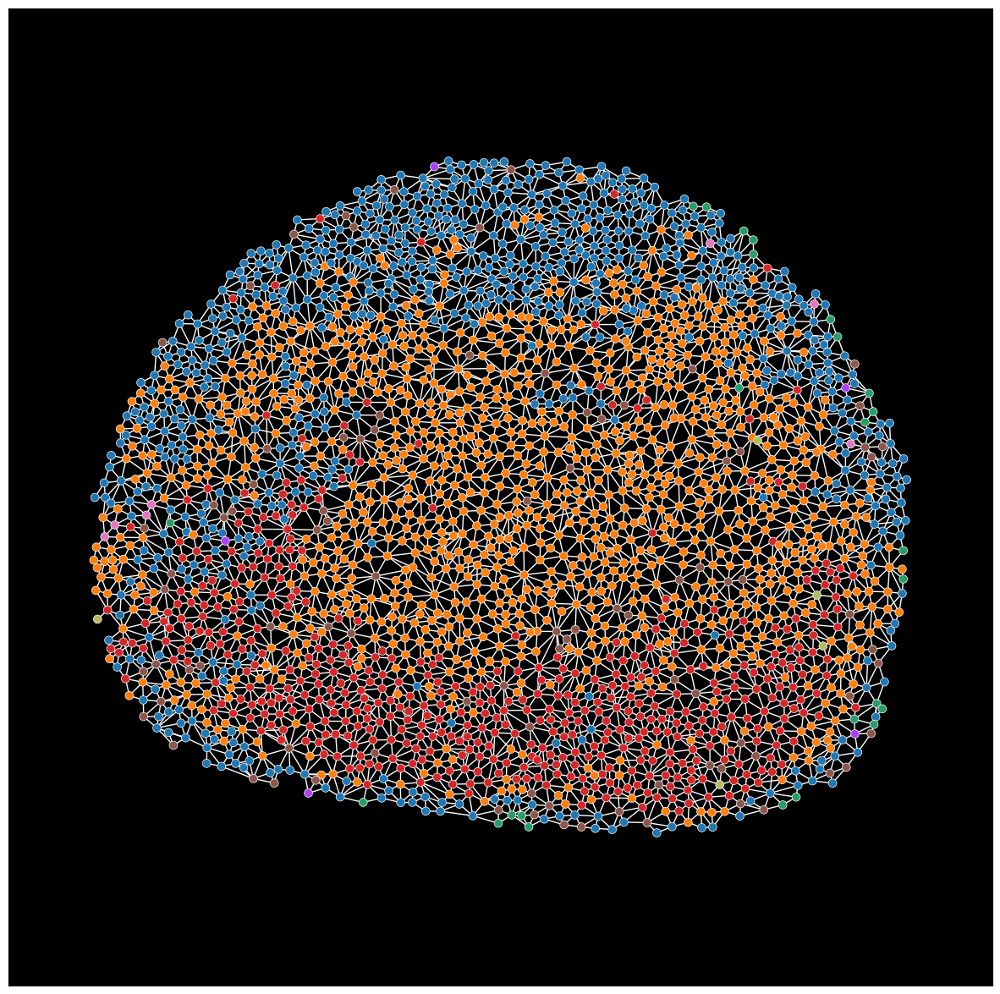

In [18]:
# Verification of extracted node order, node importance, edge importance

visualize_graph(G_new, pos, node_colors, 
    edgecolors='w',
    linewidths=0.5,
    node_size=50, 
    edge_color='w', 
    width=1, 
    arrows=False)

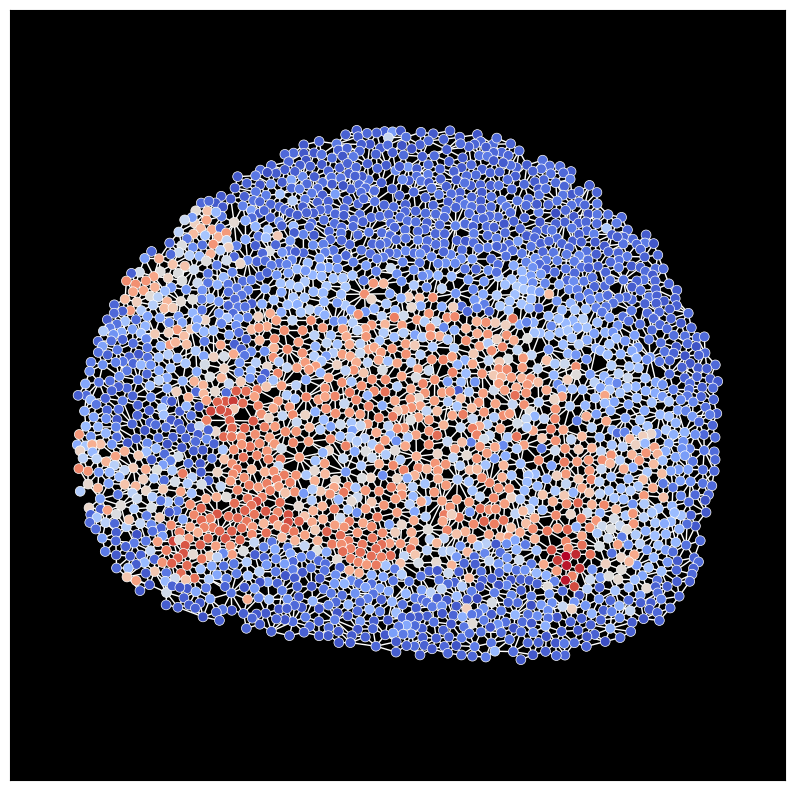

In [19]:
visualize_graph(G_new, pos, node_importances, 
    figsize=(10,10),
    edgecolors='w',
    linewidths=0.5,
    node_size=50, 
    edge_color='w', 
    cmap='coolwarm',
    arrows=False)

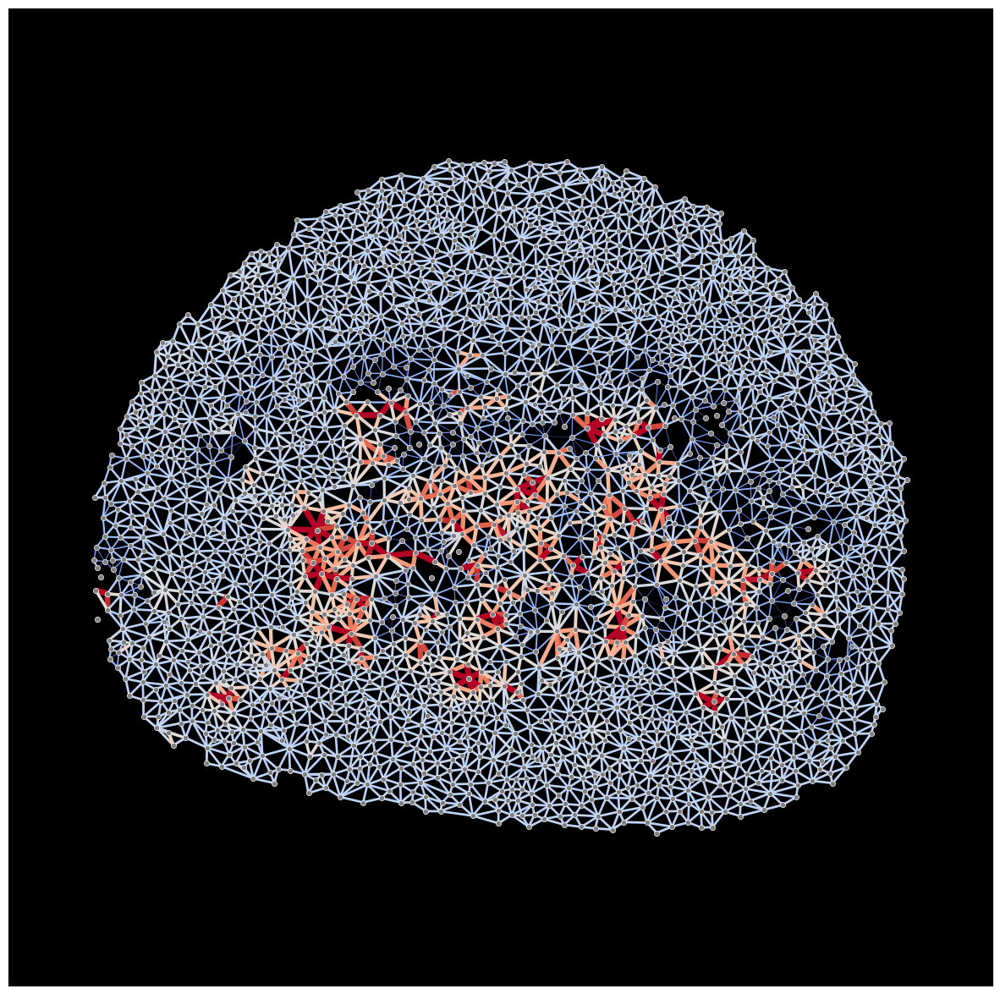

In [20]:
visualize_graph(G_new, pos, 'gray', 
    edgecolors='w',
    linewidths=0.5,
    node_size=20, 
    # edgelist=edges, 
    edge_cmap=plt.cm.coolwarm, 
    edge_color=edge_importances, 
    width=[x * 5 for x in edge_importances], 
    arrows=False)

## Examples 2

In [35]:
dfs = []
for data in tqdm(dataset[287:]):
    # Get dataset and foll number
    dataset_name, foll = data.name.split('\\')[-1][3:-3].split('_')

    # print(dataset_name, foll)

    ########
    ### Read information

    # Get node info dataframe
    df_cell_info_foll = df_cell_info[(df_cell_info.Foll == int(foll)) & (df_cell_info.Dataset == dataset_name)]

    # Get spdata
    path = spatial_omics_folder / f'07_{dataset_name}.hdf5'
    spadata = SpatialOmics.from_h5py(path)

    # Assign node type
    spadata.obs[str(foll)]['name'] = df_cell_info_foll.name.tolist()

    # Get graph information
    G = spadata.G[str(foll)]['contact']
    data_graph = torch_geometric.utils.from_networkx(spadata.G[str(foll)]['contact'])
    G_new =  torch_geometric.utils.to_networkx(data, to_undirected=True)
    G_new.remove_edges_from(nx.selfloop_edges(G_new))
    pos = spadata.obs[str(foll)][['x','y']].loc[np.array(G.nodes())].to_numpy()
    cell_types =  spadata.obs[str(foll)]['name'].loc[np.array(G.nodes())].to_numpy()
    node_colors = tuple(colors_rgb_dict[n]/255 for n in cell_types)

    #########
    ### Get information
    info_foll = info[dataset_name + '_' + foll]
    edge_importances = info_foll['edge']
    node_importances = info_foll['node']

    break

  0%|          | 0/155 [00:00<?, ?it/s]

In [36]:
data.name

'Y:\\coskun-lab\\Thomas\\11_snowflakes\\data\\torch_graph_data\\NIH_pos\\pt\\07_T3_36.pt'

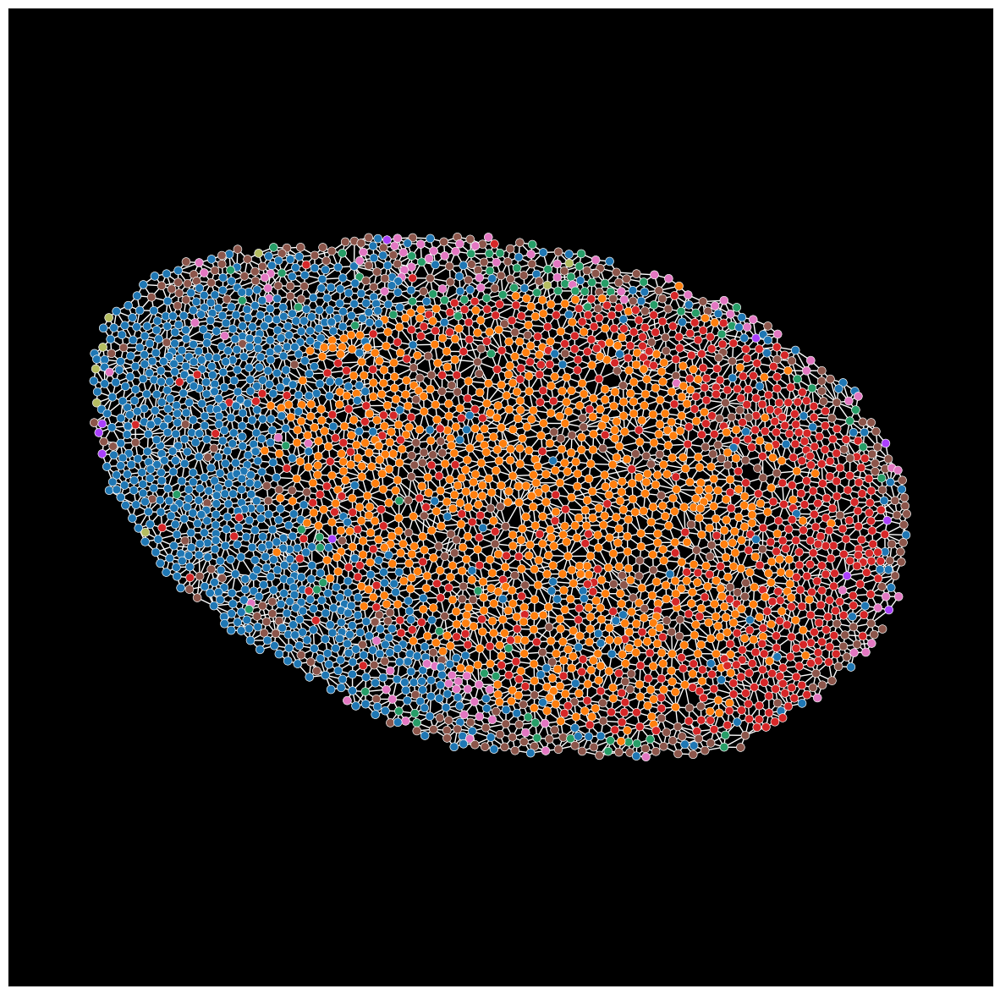

In [37]:
# Verification of extracted node order, node importance, edge importance

visualize_graph(G_new, pos, node_colors, 
    edgecolors='w',
    linewidths=0.5,
    node_size=50, 
    edge_color='w', 
    width=1, 
    arrows=False)

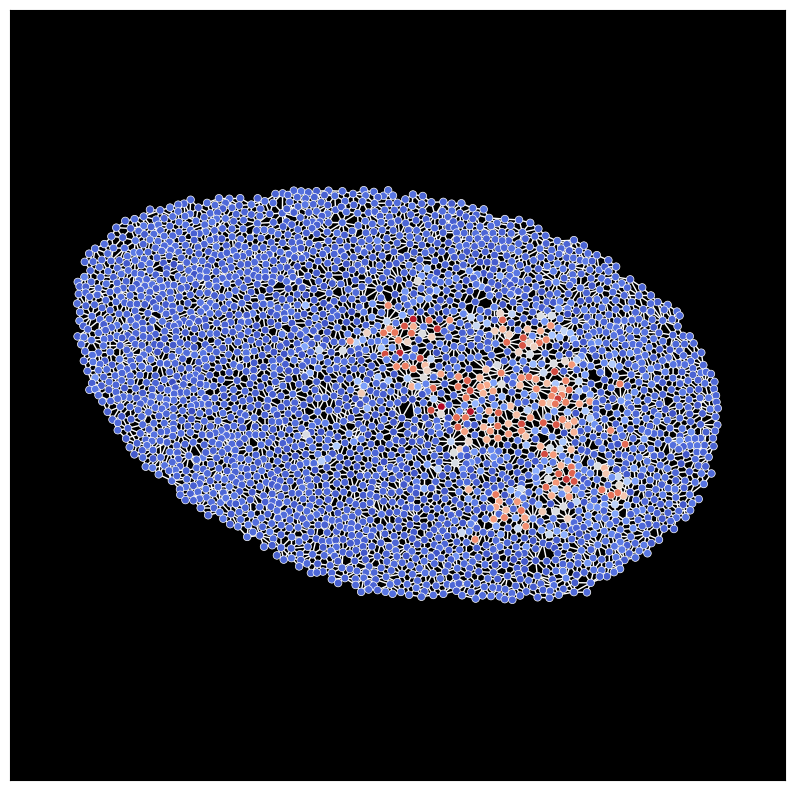

In [40]:
visualize_graph(G_new, pos, node_importances, 
    figsize=(10,10),
    edgecolors='w',
    linewidths=0.5,
    node_size=30, 
    edge_color='w', 
    cmap='coolwarm',
    arrows=False)

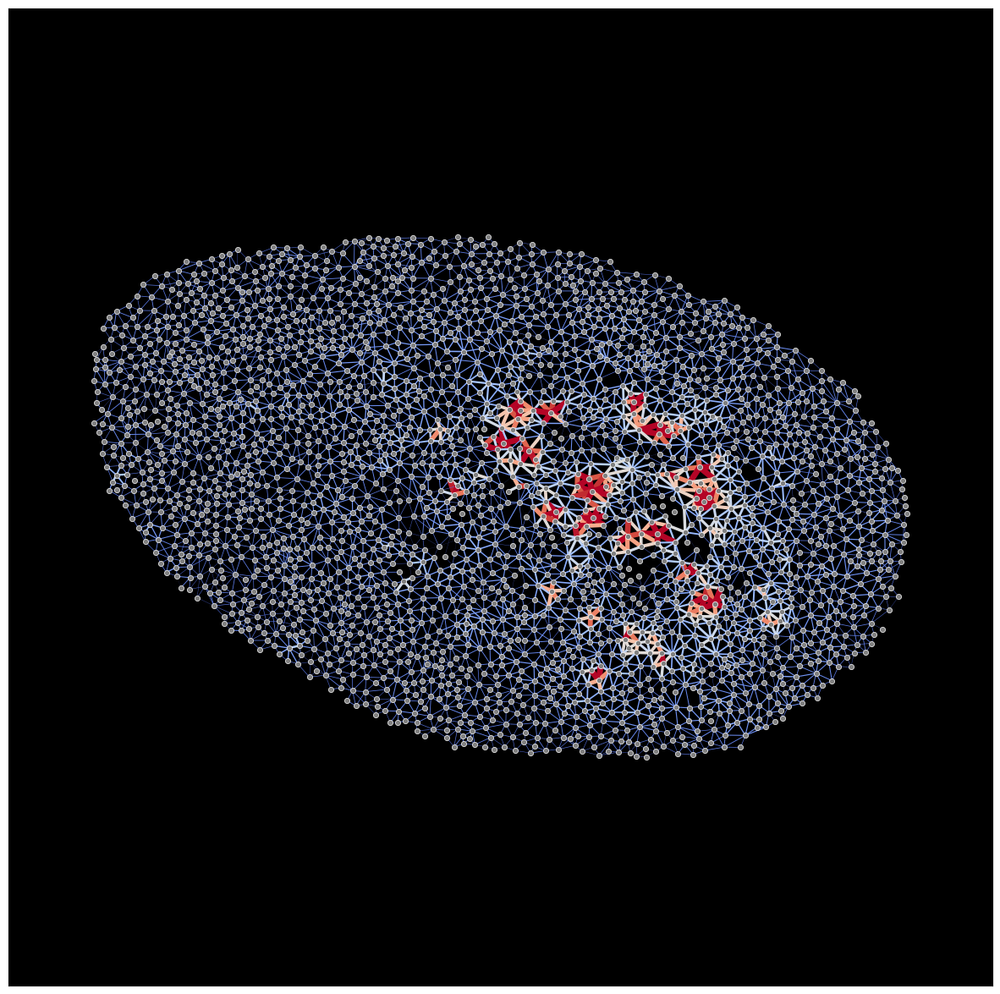

In [39]:
visualize_graph(G_new, pos, 'gray', 
    edgecolors='w',
    linewidths=0.5,
    node_size=20, 
    # edgelist=edges, 
    edge_cmap=plt.cm.coolwarm, 
    edge_color=edge_importances, 
    width=[x * 5 for x in edge_importances], 
    arrows=False)

## Example 3

In [28]:
dfs = []
for data in tqdm(dataset[6:]):
    # Get dataset and foll number
    dataset_name, foll = data.name.split('\\')[-1][3:-3].split('_')

    # print(dataset_name, foll)

    ########
    ### Read information

    # Get node info dataframe
    df_cell_info_foll = df_cell_info[(df_cell_info.Foll == int(foll)) & (df_cell_info.Dataset == dataset_name)]

    # Get spdata
    path = spatial_omics_folder / f'07_{dataset_name}.hdf5'
    spadata = SpatialOmics.from_h5py(path)

    # Assign node type
    spadata.obs[str(foll)]['name'] = df_cell_info_foll.name.tolist()

    # Get graph information
    G = spadata.G[str(foll)]['contact']
    data_graph = torch_geometric.utils.from_networkx(spadata.G[str(foll)]['contact'])
    G_new =  torch_geometric.utils.to_networkx(data, to_undirected=True)
    G_new.remove_edges_from(nx.selfloop_edges(G_new))
    pos = spadata.obs[str(foll)][['x','y']].loc[np.array(G.nodes())].to_numpy()
    cell_types =  spadata.obs[str(foll)]['name'].loc[np.array(G.nodes())].to_numpy()
    node_colors = tuple(colors_rgb_dict[n]/255 for n in cell_types)

    #########
    ### Get information
    info_foll = info[dataset_name + '_' + foll]
    edge_importances = info_foll['edge']
    node_importances = info_foll['node']

    break

  0%|          | 0/436 [00:00<?, ?it/s]

In [29]:
data.name

'Y:\\coskun-lab\\Thomas\\11_snowflakes\\data\\torch_graph_data\\NIH_pos\\pt\\07_A11_7.pt'

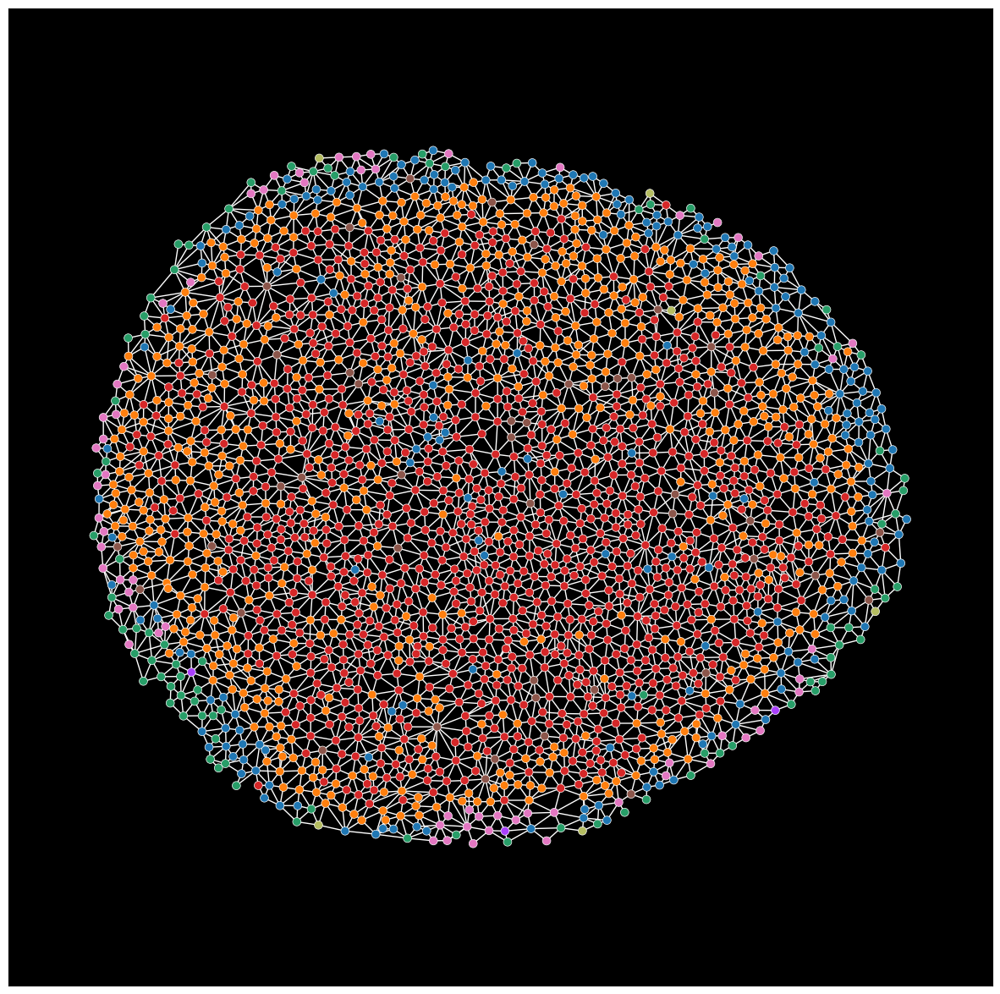

In [30]:
# Verification of extracted node order, node importance, edge importance

visualize_graph(G_new, pos, node_colors, 
    edgecolors='w',
    linewidths=0.5,
    node_size=50, 
    edge_color='w', 
    width=1, 
    arrows=False)

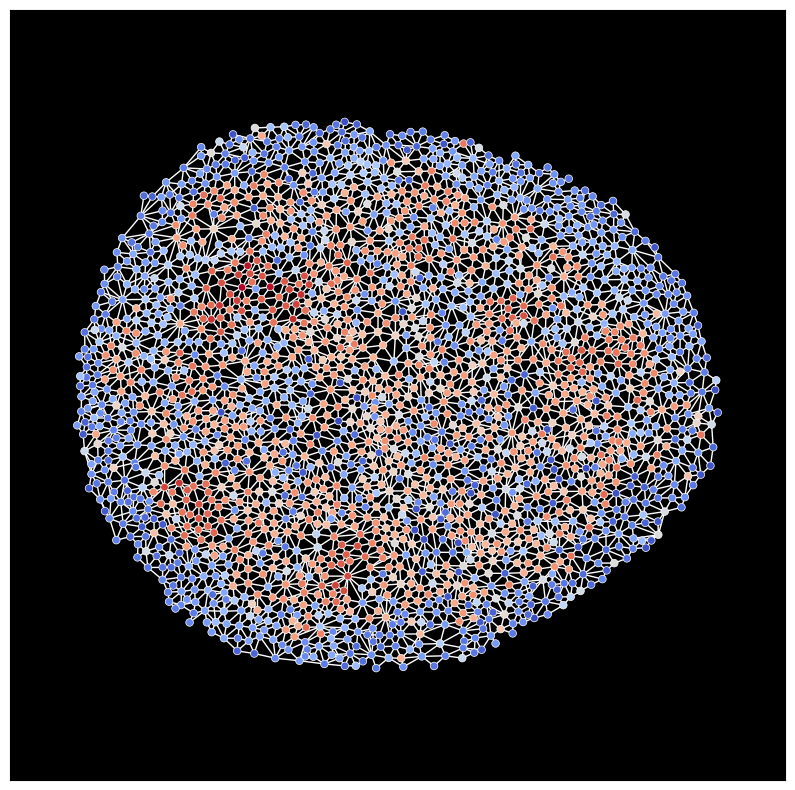

In [33]:
visualize_graph(G_new, pos, node_importances, 
    figsize=(10,10),
    edgecolors='w',
    linewidths=0.5,
    node_size=30, 
    edge_color='w', 
    cmap='coolwarm',
    arrows=False)

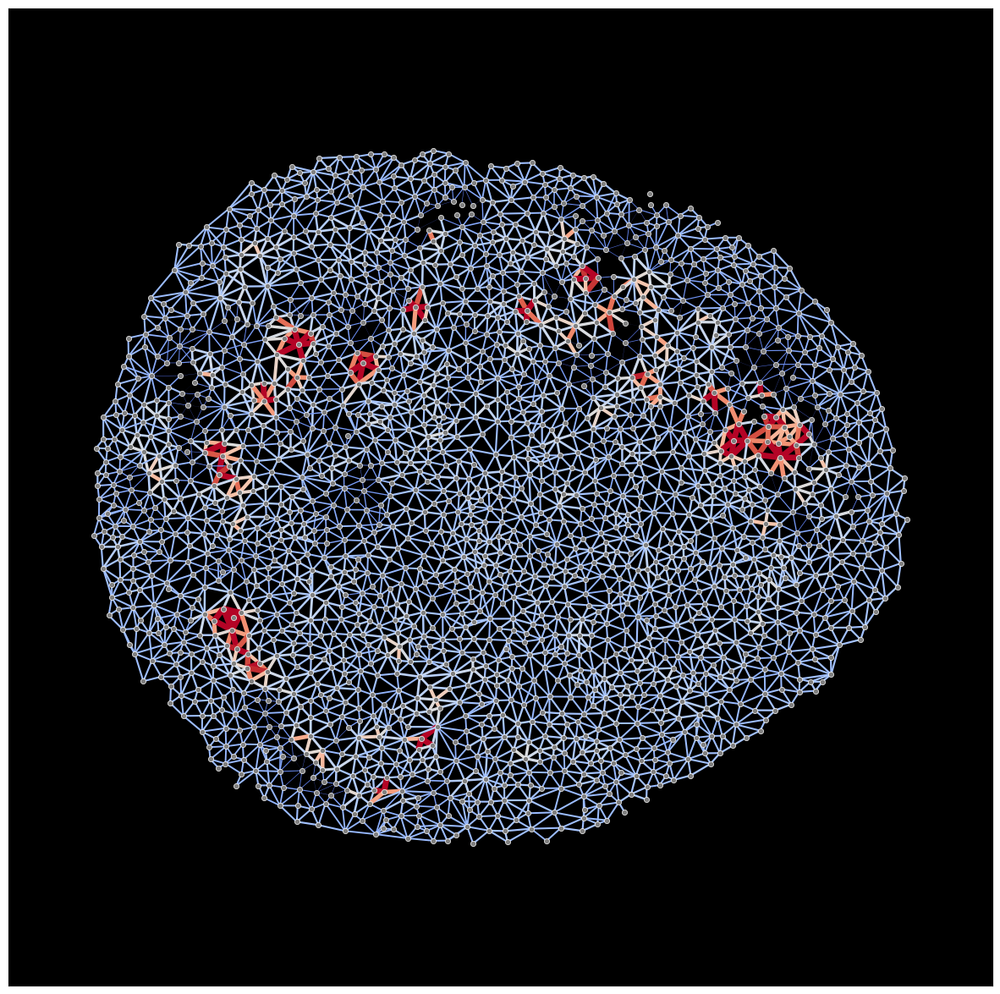

In [32]:
visualize_graph(G_new, pos, 'gray', 
    edgecolors='w',
    linewidths=0.5,
    node_size=20, 
    # edgelist=edges, 
    edge_cmap=plt.cm.coolwarm, 
    edge_color=edge_importances, 
    width=[x * 5 for x in edge_importances], 
    arrows=False)

# Plot original multiplex image

In [34]:
from skimage import measure, morphology

print(data.name)

Y:\coskun-lab\Thomas\11_snowflakes\data\torch_graph_data\NIH_pos\pt\07_A11_1.pt


In [35]:
# Read spaital data
dataset = '07_A11'
path = spatial_omics_folder / f'{dataset}.hdf5'
spadata = SpatialOmics.from_h5py(path)

# Get follicle information
foll = 1
print(foll)
foll = str(foll)

# Get mask
mask_foll = spadata.masks[foll]['cellmasks']
mask_foll = mask_foll>0
mask_foll = morphology.remove_small_holes(mask_foll, 1000)
contour_foll = measure.find_contours(mask_foll>0, 0.8)
mask_foll = mask_foll==0
mask_foll = morphology.remove_small_holes(mask_foll, 1000)

1


In [36]:
min_row = spadata.spl.loc[0].min_row*2
max_row = spadata.spl.loc[0].max_row*2
min_col = spadata.spl.loc[0].min_col*2
max_col = spadata.spl.loc[0].max_col*2
print(min_row, max_row, min_col, max_col)

2066 3554 9694 11492


In [37]:
# Read multiplex images
h5_data = (Path().cwd().parents[0]).absolute() / 'data'/ 'GC Database' / f"07_imgs.hdf5"
with h5py.File(h5_data) as f:
    datasets = list(f.keys())  # works like a dict

In [38]:
with h5py.File(h5_data) as f:
    imgs = f['A11'][:, min_row:max_row, min_col:max_col]
    labels = list(f['A11'].attrs["labels"])

In [39]:
# import napari

# viewer = napari.view_image(np.stack(imgs), name=labels, channel_axis=0)
# viewer.add_labels(mask_foll, scale=[2,2])

<Labels layer 'mask_foll' at 0x1a507364950>